# System of Conservation Laws: 1D Euler Equations

This notebook addresses the following system of conservation laws:

1. $
\partial_t \rho + \partial_x (\rho u) = 0
$
2. $
\partial_t (\rho u) + \partial_x (\rho u^2 + p) = 0
$
3. $
\partial_t (\rho E) + \partial_x ((\rho E + p)u) = 0
$


The characteristic fields are given by:
- $\lambda_1 = u - c$,
- $\lambda_2 = u$,
- $\lambda_3 = u + c$. 

where:
- $c^2 = \gamma \frac{p}{\rho}$,
- $p(\rho, e) = (\gamma - 1)\rho e$,
- $\rho E = \rho e + \frac{1}{2} \rho u^2$.

The matrices $S_L$ and $S_R$ are defined as:
- $S_L = -\Lambda$,
- $S_R = \Lambda$,

where $\Lambda$ is ????

where $f$ is the fonction given by :

$
f( \rho,u) =
\begin{pmatrix}
\rho*u \\
\rho*u^2 + p  \\
(\rho*E+p)*u 
\end{pmatrix}
$

and U the conservative variable : [$\rho$ , $\rho u $,$\rho E$ ]

In [46]:
import numpy as np 
import matplotlib.pyplot as plt 

In [47]:

def c(gamma,p,rho):
    return np.sqrt(gamma*p/rho)

def p(gamma,rho,e):
    return (gamma-1)*rho*e

def pE(rho,e,u):
    return rho*e + 1/2*rho*u**2



asked to MISTRAL AI what was $\Lambda$ as it is not described in the subject, and the only time we use this notation were for the diagonal matrix of hyperbolic system, the answer was : 
Contexte : Valeurs propres et vitesses d'ondes
Les valeurs propres du système d'Euler sont données par :
λ1=u−c,λ2=u,λ3=u+c\lambda_1 = u - c, \quad \lambda_2 = u, \quad \lambda_3 = u + cλ1​=u−c,λ2​=u,λ3​=u+c
où c=γpρc = \sqrt{\gamma \frac{p}{\rho}}c=γρp​​ est la vitesse du son.
Ces valeurs propres représentent les vitesses de propagation des ondes dans le fluide.

Solveur HLL : Estimation des vitesses d'ondes
Le solveur HLL est un solveur de Riemann approximatif qui utilise deux vitesses d'ondes, SLS_LSL​ et SRS_RSR​, pour estimer les flux aux interfaces des cellules. Ces vitesses sont des bornes pour les vitesses réelles des ondes dans le problème de Riemann local.

SLS_LSL​ est une estimation de la vitesse de l'onde la plus à gauche (généralement la plus petite valeur propre).
SRS_RSR​ est une estimation de la vitesse de l'onde la plus à droite (généralement la plus grande valeur propre).

Dans votre cas, on vous demande d'utiliser :
SL=−Λ,SR=ΛS_L = -\Lambda, \quad S_R = \LambdaSL​=−Λ,SR​=Λ
où Λ est une estimation de la vitesse maximale des ondes dans le système. En pratique, on prend souvent :
Λ=max⁡(∣u∣+c)\Lambda = \max(|u| + c)Λ=max(∣u∣+c)
sur les deux états ULU_LUL​ et URU_RUR​ de part et d'autre de l'interface

So  $\Lambda$ is a value the ensure the stability of the scheme, 


In [ ]:

def HLL_flux(U_L,U_R,gamma): #given by lecture 
    
                  
    rho_L, rho_u_L, rho_e_L = U_L
    rho_R, rho_u_R, rho_e_R = U_R

    u_L = rho_u_L / rho_L
    u_R = rho_u_R / rho_R

    e_L = rho_e_L / rho_L - 0.5 * u_L**2
    e_R = rho_e_R / rho_R - 0.5 * u_R**2

    p_L = p(gamma, rho_L, e_L)
    p_R = p(gamma, rho_R, e_R)

    c_L = c(gamma,p_L,rho_L)
    c_R = c( gamma,p_R, rho_R)

    
    lam = max(abs(u_L)+c_L, abs(u_R)+c_R)   # local majorant (tu peux aussi prendre un Λ global max_i)
    S_L, S_R = -lam, +lam

   
    F_l = np.array([rho_L * u_L, rho_L  * u_L**2 +p_L, (rho_e_L + p_L) *u_L ])
    F_R = np.array([rho_R * u_R, rho_R  * u_R**2 +p_R, (rho_e_R + p_R) *u_R ])

    #print(F_l,F_R,S_L,S_R)
    if 0 >= S_L:
        return F_l
    elif 0 <= S_R:
        return F_R
    else :
        return (S_R*F_l - S_L*F_R + S_L*S_R*(U_R-U_L))/(S_R-S_L) #formula given in lecture in 2.3.1 on HLL numerical scheme 

def godunov_scheme(U_init, init_left, init_right, nt, nx, dt, dx, gamma):
    U = np.array(U_init, dtype=float)
    U_new = np.zeros_like(U)
    F = np.zeros_like(U)
    

    for _ in range(nt):
        print(U)
        U_new = U.copy()
        U_new[:, 0]  = init_left
        U_new[:, -1] = init_right
        for i in range(nx-1):
            F[:, i] = HLL_flux(U[:, i], U[:, i+1],gamma)
        for i in range(1, nx-2):
            U_new[:, i] = U[:, i] - (dt/dx) * (F[:, i] - F[:, i-1]) # Ui -   dt/dx*(F(Ui,Ui+1) - F(Ui-1,Ui)) 
        U = U_new.copy()

    return U


In [71]:
def minmod(alpha,beta,gamma):
    if alpha > 0 and beta > 0 and gamma > 0:
        return min(alpha,beta,gamma)
    elif alpha < 0 and beta < 0 and gamma < 0:
        return max(alpha,beta,gamma)
    else:
        return 0 


def MUSCL_scheme(U_init, init_left, init_right, nt, nx, dt, dx, gamma):
    U = np.array(U_init, dtype=float)
    U_new = np.zeros_like(U)

    U[:, 0] = init_left
    U[:, -1] = init_right
    for _ in range(nt):
        U_new = U.copy()
        for i in range(2, nx-2):
            U_rec_L = np.zeros(3)
            U_rec_R = np.zeros(3)

            for k in range(3):
                #Computing the slop of recontruction of index i+1/2
                alpha = (U[k, i] - U[k, i-1]) / dx
                beta = (U[k, i+1] - U[k, i]) / dx
                Gamma = (U[k, i+1] - U[k, i-1]) / (2*dx)
                slope_i = minmod(alpha, Gamma, beta)

                U_rec_L[k] = U[k, i] + 0.5 * dx * slope_i

                alpha = (U[k, i+1] - U[k, i]) / dx
                beta = (U[k, i+2] - U[k, i+1]) / dx
                Gamma = (U[k, i+2] - U[k, i]) / (2*dx)

                slope_i = minmod(alpha, Gamma, beta)

                U_rec_R[k] = U[k, i+1] - 0.5 * dx * slope_i

            # HLL_flux for i+1/2
            Fi_p = HLL_flux(U_rec_L, U_rec_R, gamma)

            # same for index i-1/2
            for k in range(3):
                alpha = (U[k, i-1] - U[k, i-2]) / dx
                beta = (U[k, i] - U[k, i-1]) / dx
                Gamma = (U[k, i] - U[k, i-2]) / (2*dx)

                slope_i_minus = minmod(alpha, Gamma, beta)

                U_rec_L[k] = U[k, i-1] + 0.5 * dx * slope_i_minus

                alpha = (U[k, i] - U[k, i-1]) / dx
                beta = (U[k, i+1] - U[k, i]) / dx
                Gamma = (U[k, i+1] - U[k, i-1]) / (2*dx)
                
                slope_i_minus = minmod(alpha, Gamma, beta)

                U_rec_R[k] = U[k, i] - 0.5 * dx * slope_i_minus

            # HLL_flux for i-1/2
            Fi_m = HLL_flux(U_rec_L, U_rec_R, gamma)

            U_new[:, i] = U[:, i] - 1/dx*(Fi_p-Fi_m) # 1/dx by
        U = U_new.copy()

    return U


409
[1. 2. 4.] [1. 2. 4.] -2.18321595660938 2.18321595660938
[1. 2. 4.] [1. 2. 4.] -2.183215956602627 2.183215956602627
[1. 2. 4.] [1. 2. 4.] -2.18321595659169 2.18321595659169
[1. 2. 4.] [1. 2. 4.] -2.183215956574068 2.183215956574068
[1. 2. 4.] [1. 2. 4.] -2.1832159565458182 2.1832159565458182
[1. 2. 4.] [1. 2. 4.] -2.183215956500761 2.183215956500761
[1. 2. 4.] [1. 2. 4.] -2.1832159564292644 2.1832159564292644
[1. 2. 4.] [1. 2. 4.] -2.183215956316392 2.183215956316392
[1. 2. 4.] [1. 2. 4.] -2.183215956139107 2.183215956139107
[1. 2. 4.] [1. 2. 4.] -2.1832159558620736 2.1832159558620736
[1. 2. 4.] [1. 2. 4.] -2.183215955431378 2.183215955431378
[1. 2. 4.] [1. 2. 4.] -2.1832159547652106 2.1832159547652106
[1. 2. 4.] [1.00000001 2.00000001 4.        ] -2.1832159537400972 2.1832159537400972
[1.00000001 2.00000001 4.        ] [1.00000001 2.00000001 4.00000001] -2.183215952170699 2.183215952170699
[1.00000001 2.00000001 4.00000001] [1.00000002 2.00000002 4.00000001] -2.18321594978032 2.18

C:\Users\axeld\AppData\Local\Temp\ipykernel_23720\3348560183.py:2: RuntimeWarning: invalid value encountered in sqrt
  return np.sqrt(gamma*p/rho)


[1. 2. 4.] [1. 2. 4.] -2.18321595660938 2.18321595660938
[1. 2. 4.] [1. 2. 4.] -2.18321595660938 2.18321595660938
[1. 2. 4.] [0.99999997 2.00000001 3.99999991] -2.18321595660938 2.18321595660938
[0.99999997 2.00000001 3.99999991] [1.00000056 1.9999999  4.00000157] -2.1832188295741526 2.1832188295741526
[1.00000056 1.9999999  4.00000157] [0.99999531 2.00000086 3.99998678] -2.1832188295741526 2.1832188295741526
[0.99999531 2.00000086 3.99998678] [1.00002646 1.99999516 4.00007452] -2.1833527146056175 2.1833527146056175
[1.00002646 1.99999516 4.00007452] [0.99988712 2.00002079 3.99968193] -2.1833527146056175 2.1833527146056175
[0.99988712 2.00002079 3.99968193] [1.00038161 1.99993144 4.00107369] -2.185202332422439 2.185202332422439
[1.00038161 1.99993144 4.00107369] [0.99886118 2.00022092 3.99678136] -2.185202332422439 2.185202332422439
[0.99886118 2.00022092 3.99678136] [1.00260764 1.9995988  4.00727891] -2.1974082840009217 2.1974082840009217
[1.00260764 1.9995988  4.00727891] [0.99301672

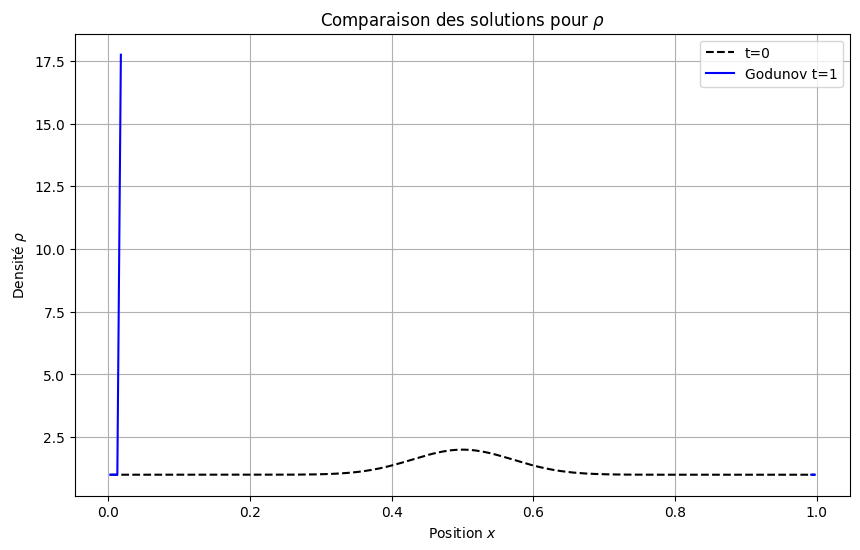

In [73]:
#initial data/condtion

gamma = 1.4
def initial_condition(x, x0):
    rho = 1 + np.exp(-100 * (x - x0)**2)
    p = np.ones_like(x)
    u = np.ones_like(x)
    return rho, p, u

nx = 200 
dx = 1.0/nx
x = np.linspace(0, 1, nx+1)[:-1] + dx/2

#Initial condition
rho_init, p_init, u_init = initial_condition(x,0.5)
rho_u_init = rho_init * u_init
rho_E_init = p_init / (1.4 - 1) + 0.5 * rho_init * u_init**2
U_init = np.array([rho_init, rho_u_init, rho_E_init])


#Temporel parameter 
cfl = 0.9
dt= cfl * dx / (np.max(u_init) + np.sqrt(1.4 * np.max(p_init) / np.max(rho_init)))  # dt < CFL*dx/lamba_max (lambda 3 here )
nt = int(1.0 / dt) + 1
print(nt)

# Scheme execution
U_final_godunov = godunov_scheme(U_init, U_init[:, 0], U_init[:, -1], nt, nx, dt, dx, gamma=1.4)
U_final_muscl = MUSCL_scheme(U_init, U_init[:, 0], U_init[:, -1], nt, nx, dt, dx, gamma=1.4)

#Plot result 
plt.figure(figsize=(10, 6))
plt.plot(x, rho_init, label="t=0", color="black", linestyle="--")

# État final avec Godunov
plt.plot(x, U_final_godunov[0, :], label="Godunov t=1", color="blue")
#État final avec MUSCL
#plt.plot(x, U_final_muscl[0, :], label="MUSCL t=1", color="red")

# Légende et titres
plt.title("Comparaison des solutions pour $\\rho$")
plt.xlabel("Position $x$")
plt.ylabel("Densité $\\rho$")
plt.legend()
plt.grid(True)

# Affichage
plt.show()

